In [1]:
# Step 1: Upload ZIP file manually
from google.colab import files
files.upload()  # upload your dataset zip

Saving walmart sale forcast.zip to walmart sale forcast (1).zip


{'walmart sale forcast (1).zip': b'PK\x03\x04-\x00\x00\x00\x08\x00\x8d+\x95T\xa2\xc53\xb4\xff\xff\xff\xff\xff\xff\xff\xff\x0c\x00\x14\x00features.csv\x01\x00\x10\x00\xa1\t\t\x00\x00\x00\x00\x00\xd2\xbc\x02\x00\x00\x00\x00\x00\x8c\x9dY\x8fm\xcbr\x95\xdf\xf9-\xeb\x94\xb2o\x1e-\xc0\x02\t,\x0b\xc33\xb2\xe0> \xdc c\x84\xfc\xef\x89oD\xce\xdaU\xb5"\xf7E\x02\xdf}\xf69\x11k\xce\x9c\x99\x91\xd1\x8c\x11\xf17\xff\xfc\x8f\xff\xf4\xa7\xd7\xbf\xf9\xdb\x7f\xfe\xd3\xeb?\xff\xe9\xef\xff\xd7\x9f\xfe\xe9o\xff\xf9\xff\xd8_\xfc\xe5\xff\xf9\xd3\xdf\xfd\xd7\xbf\xfe\xa7\xff\xf1\xdf\xfe\xf4\xfa\x8f\x7f\xfbO\xff\xf3\xdf\xfc\xe3\xff\xfd\x87\xfc\xf9\xa7\xf2\xf9\xa7\xfa\xf9\xa7\xf6\xf9\xa7\xfe\xfa\xd7\x7f\xfd\xef_\xff\xe5\x1fL\xdb\xdf\xfd\xe3\xbf\xfc\xfd\x9f\xfe\xe1\x9f_\xff\xfe\x7f\xff\xbb\x7f\xfc\xbb\xff\xf1\xdf\xff\xf6_\xfeU~\x95\x94\xd3\x1f\xa9\xfc\x91\xfa\xab\x95\x8fj\x7f\xf1\xd1gy\xfd\xd5_|\xfb\x7f%\xe7\x8f\xb4G\xed\xab\xbc\xd6GN\xe3\xf5\x97\x7f\xf1\x1f\xfe\xe6\xdf~\x91\xcf\xe5U\xd7G\x97|[\x91|i%\x8f\xbd\x8e\

In [4]:
# Step 2: Unzip dataset
import zipfile, os
zip_path = "/content/walmart sale forcast.zip"  # replace with your filename
extract_folder = "/content/walmart_data"
with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(extract_folder)
print("Unzipped to:", extract_folder)

Unzipped to: /content/walmart_data


In [18]:
extract_path = "/content/walmart_data"


In [19]:
import pandas as pd

# Load files
train = pd.read_csv(os.path.join(extract_path, "train.csv"))
features = pd.read_csv(os.path.join(extract_path, "features.csv"))
stores = pd.read_csv(os.path.join(extract_path, "stores.csv"))

# Merge
data = train.merge(features, on=["Store", "Date"], how="left") \
            .merge(stores, on="Store", how="left")

print("✅ Merged dataset shape:", data.shape)


✅ Merged dataset shape: (421570, 17)


In [20]:
#preprocessing
# Convert date column
data['Date'] = pd.to_datetime(data['Date'])

# Drop second holiday column to avoid confusion
data.drop('IsHoliday_y', axis=1, inplace=True)

# Convert 'IsHoliday_x' to int and rename
data['IsHoliday'] = data['IsHoliday_x'].astype(int)
data.drop('IsHoliday_x', axis=1, inplace=True)

# Fill missing markdowns with 0
markdown_cols = [col for col in data.columns if 'MarkDown' in col]
for col in markdown_cols:
    data[col].fillna(0, inplace=True)

# Fill any other missing values with median
data.fillna(data.median(numeric_only=True), inplace=True)

# Time features
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['WeekOfYear'] = data['Date'].dt.isocalendar().week

# Encode store type
data = pd.get_dummies(data, columns=['Type'], drop_first=True)


/tmp/ipython-input-20-2500139802.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(0, inplace=True)


In [21]:
#define features and target
# Drop irrelevant or non-numeric columns
X = data.drop(['Weekly_Sales', 'Date'], axis=1)
y = data['Weekly_Sales']


In [22]:
#train test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)


In [23]:
#train model RANDOM FOREST
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [25]:
#evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

y_pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(" R² Score:", r2)
print(" RMSE:", rmse)


 R² Score: 0.9740659500599338
 RMSE: 3677.4794046449406


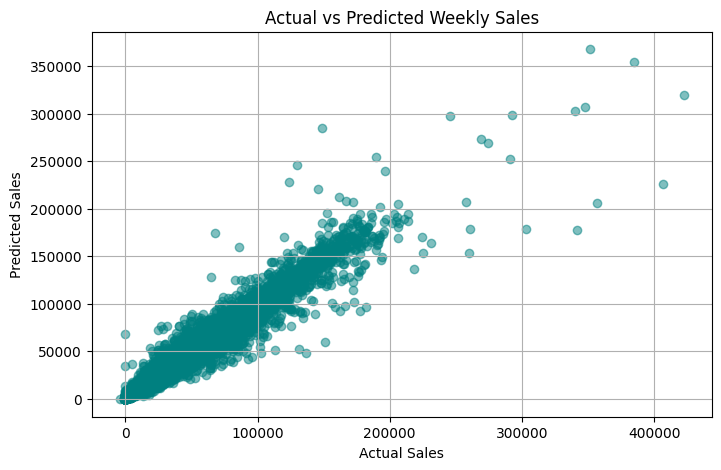

In [26]:
#visualization
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.scatter(y_test, y_pred, alpha=0.5, color='teal')
plt.title("Actual vs Predicted Weekly Sales")
plt.xlabel("Actual Sales")
plt.ylabel("Predicted Sales")
plt.grid(True)
plt.show()
